# Lab 3: The geometry of two views

In this lab you will learn how to estimate the fundamental matrix that relates two images, corresponding to two different views of the same scene, given a set of correspondences between them. Then, you will apply the estimation of the fundamental matrix to solve the photo-sequencing problem.

The following file combines some text cells (Markdown cells) and code cells. Some parts of the code need to be completed. All tasks you need to complete are marked in <span style='color:Green'> green.  </span>

In [1]:
import time
import numpy as np
import cv2
import math
import sys
import random
import matplotlib
from numpy import linalg as LA
from matplotlib import pyplot as plt
from operator import itemgetter
from utils import normalise_last_coord
from utils import normalize_points
from utils import fundamental_matrix
from utils import essential_matrix
from utils import kp_match
from utils import draw_matches
from utils import compute_inliers
from utils import ransac_fundamental_matrix
from utils import compute_epipolar_lines
from utils import draw_epipolar_lines
from utils import ImageDraw, Image, line_draw, plot_img

## **1. Estimation of the fundamental matrix**

### **1.1 DLT algorithm**

The first task is to create the function that estimates the fundamental matrix given a set of point correspondences between a pair of images.

<span style='color:Green'> - Complete the function "fundamental_matrix" below.  </span>

<span style='color:Yellow'>See functions in `utils.py`</span>

In order to check that the completed function works properly you may use this code which is a toy example where we know the ground truth image.

<span style='color:Green'> - Complete the expression of the ground truth fundamental matrix.  </span>

In order to test the fundamental matrix estimation function, we create 2 cameras, one at the origin and the other with a known translation and rotation. Thus, we can easily compute the ground truth fundamental matrix. Knowing that 
$$F=K'^{-T}E K^{-1}$$
$$P=K[R|t]$$
$$P_1=[I|0]$$
$$P_2=[R|t]$$
we can deduce that $K=K'=I$ and, consequently $F=E$. Therefore, to compute the ground truth fundamental matrix we just need to algebraically compute the essential matrix $E$.

In [2]:
# Two camera matrices for testing purposes
P1 = np.zeros((3,4))
P1[0,0]=P1[1,1]=P1[2,2]=1
angle = 15
theta = np.radians(angle)
c = np.cos(theta)
s = np.sin(theta)
R = np.array([[c, -s, 0], [s, c, 0], [0, 0, 1]])
t = np.array([[.3, .1, .2]])

P2 = np.concatenate((R, t.T), axis=1)
n = 8
rand = np.random.uniform(0,1,n)
rand = rand.reshape((1, n))
rand2 = np.random.uniform(0,1,2*n)
rand2 = rand2.reshape((2, n))
ones = np.ones((1,n))
X = np.concatenate((rand2, 3*rand, ones), axis=0)

x1_test = P1 @ X
x2_test = P2 @ X

# Estimate fundamental matrix (you need to create this function)
F_es = fundamental_matrix(x1_test, x2_test)

# Ground truth fundamental matrix 
F_gt = essential_matrix(t, R)


r = lambda i: x2_test[:, i].T @ F_gt @ x1_test[:, i]
print("Taking an arbitrary correspondance of points x and x', this should be ~0. x'.T @ E @ x =", r(0))
print("Taking an arbitrary correspondance of points x and x', this should be ~0. x'.T @ E @ x =", r(7))

# Evaluation: these two matrices should be very similar
F_gt = np.sign(F_gt[0,0])*F_gt / LA.norm(F_gt)
F_es = np.sign(F_es[0,0])*F_es / LA.norm(F_es)

with np.printoptions(suppress=True):
    print("--- Ground truth F ---")
    print(F_gt)
    print("--- Estimated F ---")
    print(F_es)
    print("--- Difference ---")
    print("All decimals:", LA.norm(F_gt-F_es))
    print("First 3 decimals:", np.round(LA.norm(F_gt-F_es), 3))

Taking an arbitrary correspondance of points x and x', this should be ~0. x'.T @ E @ x = 1.1102230246251565e-16
Taking an arbitrary correspondance of points x and x', this should be ~0. x'.T @ E @ x = -2.7755575615628914e-17
--- Ground truth F ---
[[ 0.0978244   0.36508565 -0.18898224]
 [-0.36508565  0.0978244   0.56694671]
 [ 0.03580622 -0.59654067 -0.        ]]
--- Estimated F ---
[[ 0.0978244   0.36508565 -0.18898224]
 [-0.36508565  0.0978244   0.56694671]
 [ 0.03580622 -0.59654067  0.        ]]
--- Difference ---
All decimals: 1.948471197835803e-15
First 3 decimals: 0.0


### **1.2 Robust estimation of the fundamental matrix**

The goal of this section is to estimate the fundamental matrix in a practical situation where the image correspondences contain outliers. For that you will have to write the code of the robust version of the previous algorithm.

We will start by computing and visualizing the image matches.

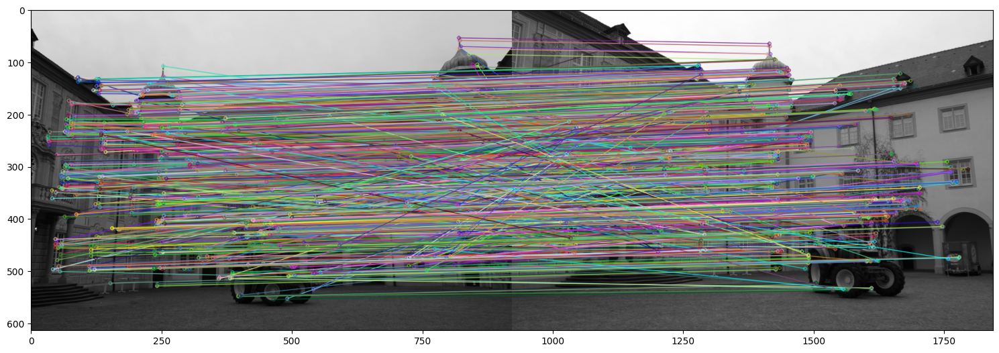

In [3]:
# Compute inage correspondences #

# Read images
img1 = cv2.imread('Data/0000_s.png', cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('Data/0001_s.png', cv2.IMREAD_GRAYSCALE)

kp1, kp2, matches = kp_match(img1, img2)

# Draw matches
draw_matches(img1, kp1, img2, kp2, matches)

<span style='color:Green'> - Write the function Ransac_fundamental_matrix that embeds in a RANSAC procedure the previous DLT algorithm for estimating the fundamental matrix. You may use the provided RANSAC function in lab 2 as a starting point.  </span>

Note: In order not to end up, eventually, in an infinite loop, it is recommended to set, at each iteration, the maximum number of iterarions to the maximum between a predefined maximum number of iterations by the user and the automatically estimated max. number of iterarions. The estimated number of iterations ensures we pick, with a probability of 0.99, an initial set of correspondences with no outliers.

<span style='color:Yellow'>See functions in `utils.py`</span>

The Sampson distance provides a first-order approximation of the geometric error of a point correspondence. It is defined as: 
$$d(x_1,x_2,F)=\frac{(x_2^TFx_1)^2}{(Fx_1)_1^2+(Fx_1)_2^2+(F^Tx_2)_1^2+(F^Tx_2)_2^2}$$
Notice that, in contrast to the formal definition in Zisserman's book, we dropped the summation symbol in the definition of the Sampson distance. This is because we are not interested in calculating the cost of a set of correspondences, but just the distance between a single correspondence of points to be used in the RANSAC algorithm.

<span style='color:Aqua'>**TODO**: Try several values of the threshold and visualize the results.<br>Some people suggest to try from 1 to 10.</span>

--- 2.7147536277770996 seconds ---
Number of inliers: 458
Geometric error: 302.6045411863876


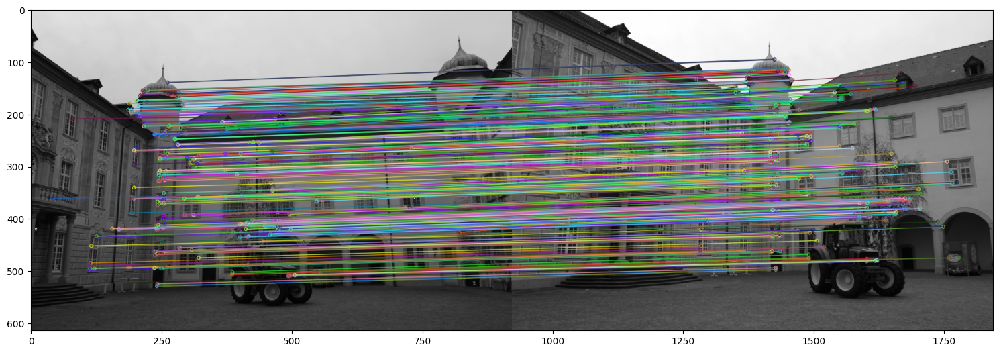

In [4]:
# Robust estimation of the fundamental matrix #
points1 = []
points2 = []

for m in matches:
    points1.append([kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1], 1])
    points2.append([kp2[m.trainIdx].pt[0], kp2[m.trainIdx].pt[1], 1])

points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

start_time = time.time()
F, indices_inlier_matches, best_geometric_error = ransac_fundamental_matrix(points1, points2, 3, 5000)
print("--- %s seconds ---" % (time.time() - start_time))
print("Number of inliers:", indices_inlier_matches.shape[0])
print("Geometric error:", best_geometric_error)

inlier_matches = itemgetter(*indices_inlier_matches)(matches)

draw_matches(img1, kp1, img2, kp2, inlier_matches)

### **1.3 Epipolar lines**

Now the fundamental matrix has been mestimated we are going to display some points and their corresponding epipolar lines.

<span style='color:Green'> - Complete the code that computes the epipolar lines in both images.  </span>

<span style='color:Yellow'>See functions in `utils.py`</span>

Computing the epipolar line is a simple operation. Given a point $x_1$ in the first image and the fundamental matrix $F$, the epipolar line in the second image is given by $l_2=Fx_1$. The epipolar line in the first image is given by $l_1=F^Tx_2$.

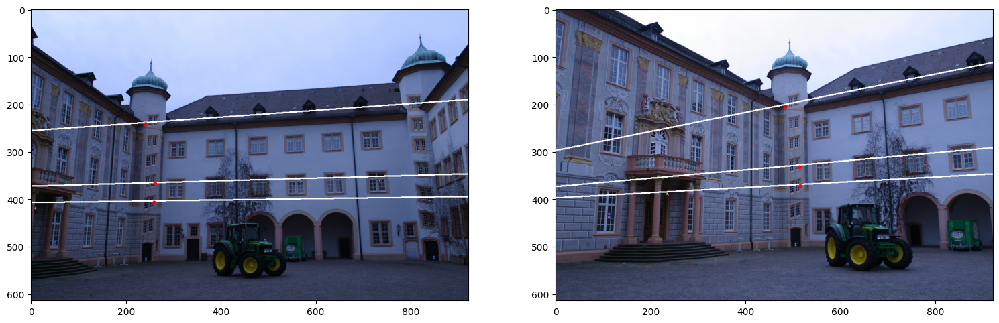

In [5]:
l2 = compute_epipolar_lines(F, points1)
l1 = compute_epipolar_lines(F.T, points2)

# choose three random indices
N = indices_inlier_matches.shape[0]
indices = random.sample(range(1, N), 3)

m1 = indices_inlier_matches[indices[0]]
m2 = indices_inlier_matches[indices[1]]
m3 = indices_inlier_matches[indices[2]]

# Draw epipolar lines and points on the images
I = draw_epipolar_lines('./Data/0000_s.png', l1, points1, inliers=(m1, m2, m3))
I2 = draw_epipolar_lines('./Data/0001_s.png', l2, points2, inliers=(m1, m2, m3))

fig, axs = plt.subplots(1, 2, figsize=(18.5, 10.5))
axs[0].imshow(I)
axs[1].imshow(I2)
plt.show()

## **2. Application: Photo-sequencing**

In this part we will compute a simplified version of the algorithm explained in the Photo-sequencing paper [1]. Since we do not have two images taken from roughly the same viewpoint at two different time instants we will manually pick a dynamic point corresponding to a point in a van (identified by index 'idx1') and the projection of its 3D trajectory in the reference image. Then we will compute the projection (to the reference image) of two points on this 3D trajectory at two different time instants (corresponding to the time when the two other provided images where taken). 

[1] T. Basha, Y. Moses, and S. Avidan. Photo Sequencing, International Journal of Computer Vision, 110(3), 2014.

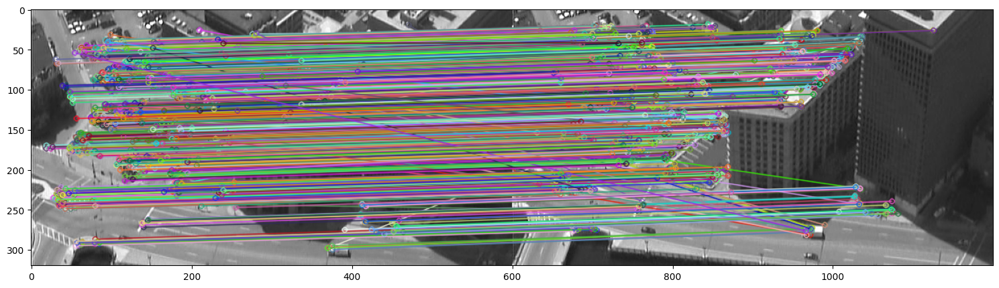

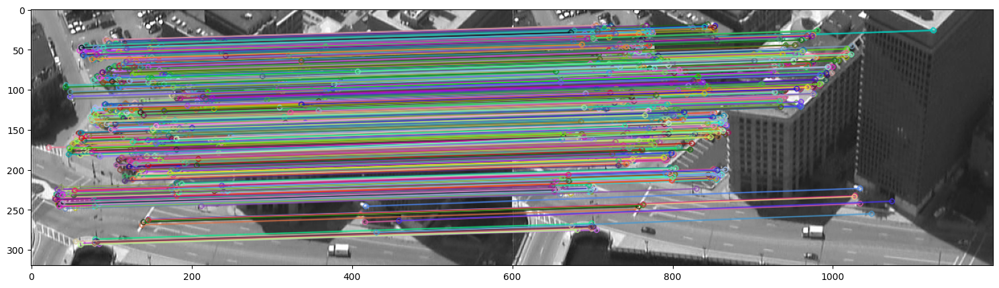

In [6]:
# Compute fundamental matrix between image 1 and 2 #

# Read images
img1 = cv2.imread('Data/frame_00000.tif',cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('Data/frame_00001.tif',cv2.IMREAD_GRAYSCALE)
img1 = img1[400:, :600]
img2 = img2[400:, :600]

# Initiate ORB detector
orb = cv2.ORB_create(nfeatures=4000,scaleFactor=1.1, edgeThreshold = 19, patchSize = 19)
# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)

# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
# Match descriptors.
matches_12 = bf.match(des1,des2)

# Show matches
img_12 = cv2.drawMatches(img1,kp1,img2,kp2,matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

# Robust estimation of the fundamental matrix #
points1 = []
points2 = []
for m in matches_12:
    points1.append([kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1], 1])
    points2.append([kp2[m.trainIdx].pt[0], kp2[m.trainIdx].pt[1], 1])

points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

F, indices_inlier_matches, best_geometric_error_12 = ransac_fundamental_matrix(points1, points2, 1, 5000)
inlier_matches_12 = itemgetter(*indices_inlier_matches)(matches_12)

img_12 = cv2.drawMatches(img1,kp1,img2,kp2,inlier_matches_12,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

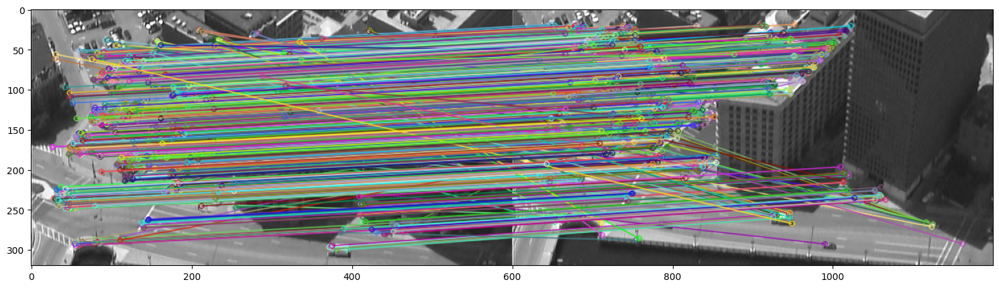

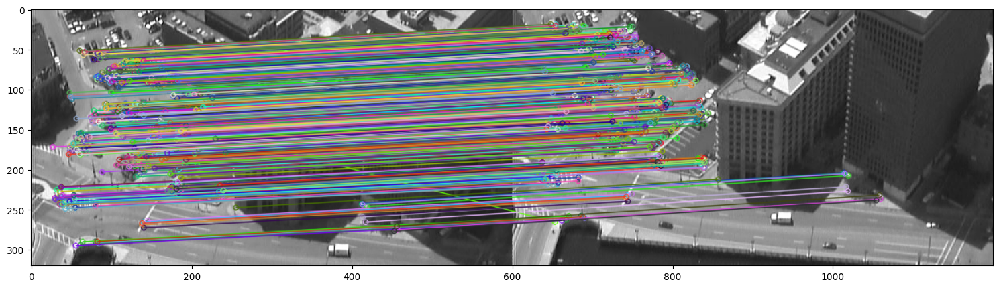

In [7]:
# Compute fundamental matrix between image 1 and 3 #

# Read images
img3 = cv2.imread('Data/frame_00002.tif',cv2.IMREAD_GRAYSCALE)
img3 = img3[400:, :600]

# find the keypoints and descriptors with ORB
kp3, des3 = orb.detectAndCompute(img3, None)

# create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
# Match descriptors.
matches_13 = bf.match(des1,des3)


# Show matches
img_13 = cv2.drawMatches(img1,kp1,img3,kp3,matches_13,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_13)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

# Robust estimation of the fundamental matrix #
points1 = []
points3 = []
for m in matches_13:
    points1.append([kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1], 1])
    points3.append([kp3[m.trainIdx].pt[0], kp3[m.trainIdx].pt[1], 1])

points1 = np.asarray(points1)
points1 = points1.T
points3 = np.asarray(points3)
points3 = points3.T

F_13, indices_inlier_matches_13, best_geometric_error_13 = ransac_fundamental_matrix(points1, points3, 0.1, 5000)
inlier_matches_13 = itemgetter(*indices_inlier_matches_13)(matches_13)

img_13 = cv2.drawMatches(img1,kp1,img3,kp3,inlier_matches_13,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_13)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

<span style='color:Green'> - Complete the code to automatically identify the corresponding point of idx1 in images 2 and 3 (you may use the previously computed matches for that). </span>

Due to more than probable differences in hardware and software version, as well as other unkown sources of stochasticity, we found that the index provided by the professor did not correspond to the van on the road. Since we cannot use the idx1 (123) from the professor, we need to estimate it ourselves.

In order to find the correct index of the keypoint, we take as reference Image 2. From the plot above, we observe that the keypoint corresponding to the van must have $height \in [250, 280]$ and $width \in [370, 400]$ ($[850, 880]$ and $[970, 1000]$ in the image above, as the axis begins at 600). Thus, we pick keypoints satisfying this constraint in location:

In [8]:
for idx,im in enumerate(matches_12):
    tmp_kp2 = kp2[im.trainIdx].pt
    if 400 > tmp_kp2[0] > 370 and 280 > tmp_kp2[1] > 250:
        print(f'{idx}: {tmp_kp2}')

90: (372.0, 277.0)
333: (373.63836669921875, 273.7867431640625)
641: (374.15374755859375, 272.8204345703125)
1208: (372.6800231933594, 274.1860046386719)
1610: (389.74346923828125, 268.9552001953125)
1680: (373.34552001953125, 276.7149353027344)
1743: (389.74346923828125, 269.2773132324219)


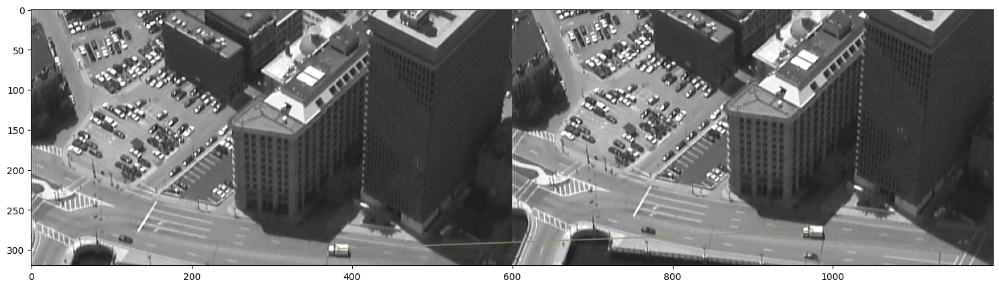

In [10]:
idx_matches_12 = 90  # Choose one of the keypoints
img_12 = cv2.drawMatches(img1, kp1, img2, kp2, [matches_12[idx_matches_12]], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

We found the index corresponding to our keypoint!

Next, we identify the indices idx1 and idx2 corresponding to this keypoint:

In [11]:
idx1 = matches_12[idx_matches_12].queryIdx
idx2 = matches_12[idx_matches_12].trainIdx

In [12]:
def find_idx(matches, idx):
    for i, m in enumerate(matches):
        if m.queryIdx == idx:
            return i, m.trainIdx
    raise Exception('Not found')

In [13]:
_, idx3 = find_idx(matches_13, idx1)

# Retrieve point coordinates
(x1, y1) = kp1[idx1].pt
(x2, y2) = kp2[idx2].pt
(x3, y3) = kp3[idx3].pt

<span style='color:Green'> - Complete the code that computes the projection of the van trajectory in image 1. </span>

In [78]:
point1 = np.array([x1, y1, 1])  # 1st point of the trajectory projected onto image 1
point1_2 = np.array([334, 293, 1])  # 2nd point of the trajectory projected onto image 1

trajectory = np.cross(point1, point1_2)

We can visualize the trajectory line we just estimated:

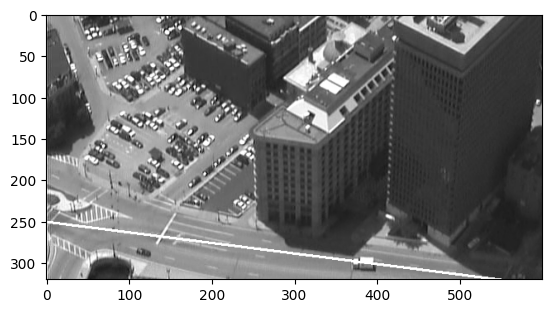

In [15]:
img_path = 'Data/frame_00000.tif'
I = Image.open(img_path).convert('RGB')
w, h = I.size
I = I.crop((0, 400, 600, h))
canv = ImageDraw.Draw(I)
line_draw(trajectory, canv, [w,h])
fig = plot_img(I)

<span style='color:Green'> - Complete the code that computes the projection of the 3D position of the van in the time instances corresponding to images 2 and 3 (points (x12, y12) and (x13, y13) respectively). </span>

<Figure size 1850x1050 with 0 Axes>

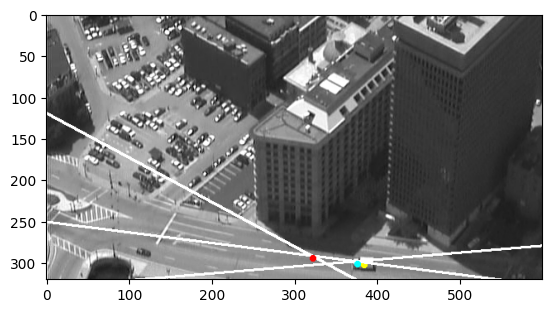

In [17]:
epiline1 = F.T @ [x2, y2, 1]  # epipolar line of the second point on image 1
point12_projected = np.cross(trajectory, epiline1)
x12, y12 = point12_projected[:2] / point12_projected[2]

epiline2 = F_13.T @ [x3, y3, 1]  # epipolar line of the third point on image 1
point13_projected = np.cross(trajectory, epiline2)
x13, y13 = point13_projected[:2] / point13_projected[2]


img_path = "Data/frame_00000.tif"
I = Image.open(img_path).convert('RGB')
w, h = I.size
size = [w,h]
I2 = I.crop((0, 400, 600, h))
canv2 = ImageDraw.Draw(I2)
canv2.ellipse((x1, y1, x1+7, y1+7), fill = 'yellow', outline ='yellow')
line_draw(trajectory, canv2, size)
line_draw(epiline1, canv2, size)
canv2.ellipse((x12, y12, x12+7, y12+7), fill = 'cyan', outline ='cyan')
line_draw(epiline2, canv2, size)
canv2.ellipse((x13, y13, x13+7, y13+7), fill = 'red', outline ='red')
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plot_img(I2)

The points are correctly ordered along the trajectory line. Because the basic assumptions of the algorithm hold, namely that the projected trajectory is a straight line and the vehicle does not move back and forth along the trajectory, we are sure that this spatial ordering is the same as the temporal ordering.


It seems though that the result is not perfect, and that the three points should be more close to each other, especially the red one corresponding to the third image. One possible cause of this defect is that the estimated fundamental matrix is noisy. To alleviate this issue, we try using SIFT descriptors.

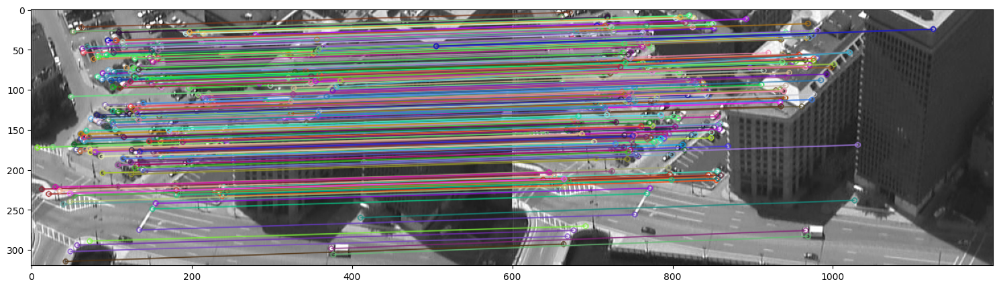

In [61]:
# Compute fundamental matrix between image 1 and 2 #

# Read images
img1 = cv2.imread('Data/frame_00000.tif',cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread('Data/frame_00001.tif',cv2.IMREAD_GRAYSCALE)
img1 = img1[400:, :600]
img2 = img2[400:, :600]

SIFTdetector = cv2.SIFT_create(nfeatures=600)
kp1, des1 = SIFTdetector.detectAndCompute(img1,None)
kp2, des2 = SIFTdetector.detectAndCompute(img2,None)
bf = cv2.BFMatcher()
matches_init = bf.knnMatch(des1,des2,k=2)

# Apply ratio test
matches_12 = []
for m,n in matches_init:
    if m.distance < 0.70*n.distance:
        matches_12.append(m)

# Show matches
img_12 = cv2.drawMatches(img1, kp1, img2, kp2, matches_12, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

In [62]:
for i, img in enumerate(matches_12):
    tmp_kp2 = kp2[img.trainIdx].pt
    if tmp_kp2[0] > 300 and tmp_kp2[1] > 250:
        print(f'{i}: {tmp_kp2}')

251: (365.9320373535156, 276.12091064453125)
319: (368.8664855957031, 283.51507568359375)


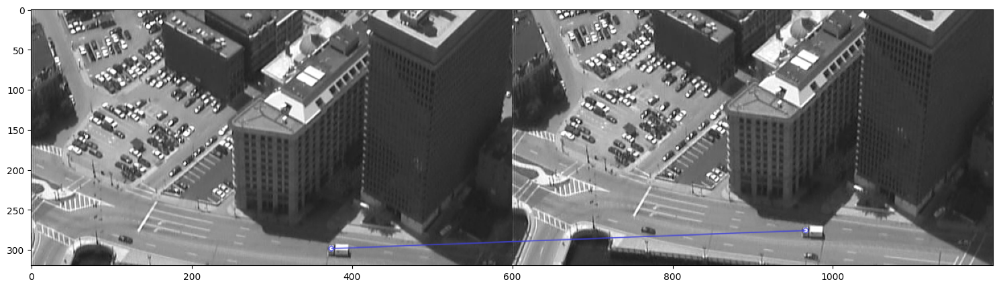

In [63]:
# Show match 251
idx_1 = 251
img_12 = cv2.drawMatches(img1,kp1,img2,kp2,[matches_12[idx_1]],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

In [64]:
idx1 = matches_12[idx_1].queryIdx
idx2 = matches_12[idx_1].trainIdx

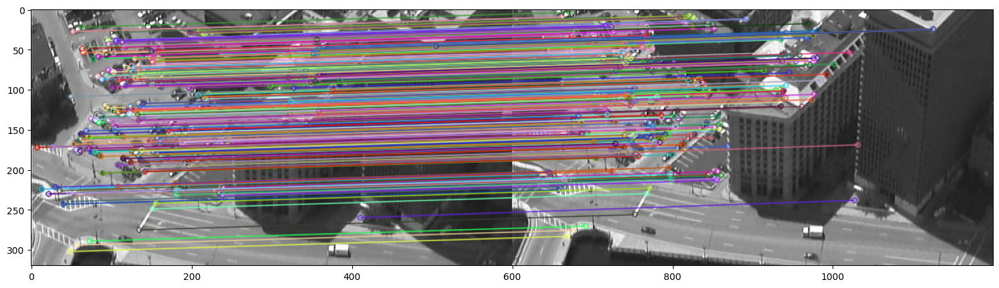

In [65]:
# Robust estimation of the fundamental matrix #
points1 = []
points2 = []
for m in matches_12:
    points1.append([kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1], 1])
    points2.append([kp2[m.trainIdx].pt[0], kp2[m.trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points2 = np.asarray(points2)
points2 = points2.T

F, indices_inlier_matches, _ = ransac_fundamental_matrix(points1, points2, 1, 5000)
inlier_matches_12 = itemgetter(*indices_inlier_matches)(matches_12)

img_12 = cv2.drawMatches(img1, kp1, img2, kp2, inlier_matches_12, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_12)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

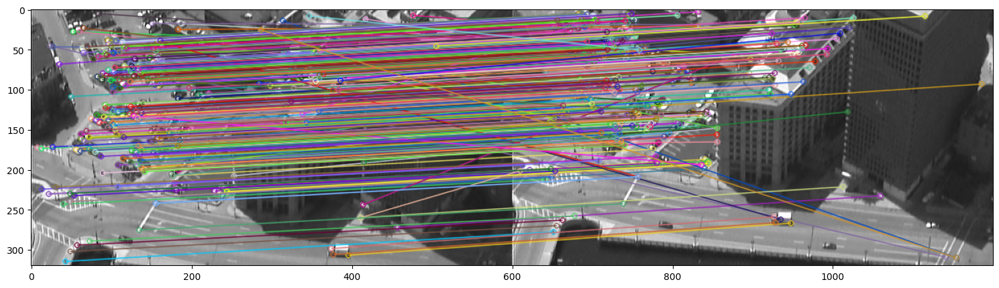

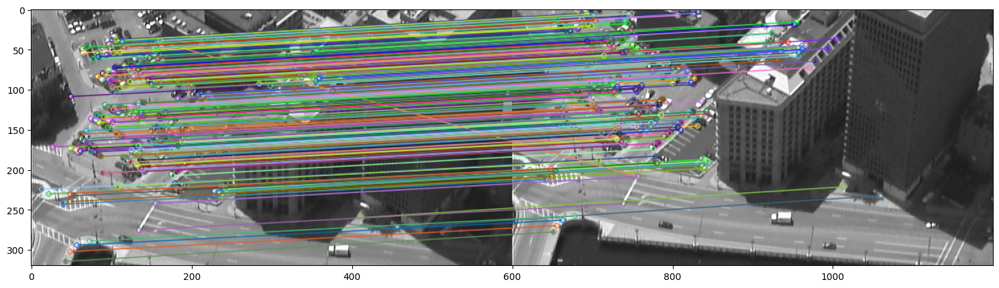

In [67]:
# Compute fundamental matrix relating the first and the third images #

# Read images
img3 = cv2.imread('Data/frame_00002.tif',cv2.IMREAD_GRAYSCALE)
img3 = img3[400:, :600]

kp3, des3 = SIFTdetector.detectAndCompute(img3,None)
bf = cv2.BFMatcher()
matches_init = bf.knnMatch(des1,des3,k=2)
# Apply ratio test
matches_13 = []
for m,n in matches_init:
    if m.distance < 0.89*n.distance:
        matches_13.append(m)

# Show matches 
img_13 = cv2.drawMatches(img1,kp1,img3,kp3,matches_13,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_13)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

# Robust estimation of the fundamental matrix #
points1 = []
points3 = []
for m in matches_13:
    points1.append([kp1[m.queryIdx].pt[0], kp1[m.queryIdx].pt[1], 1])
    points3.append([kp3[m.trainIdx].pt[0], kp3[m.trainIdx].pt[1], 1])
    
points1 = np.asarray(points1)
points1 = points1.T
points3 = np.asarray(points3)
points3 = points3.T

F_13, indices_inlier_matches_13, _ = ransac_fundamental_matrix(points1, points3, 1, 5000)
inlier_matches_13 = itemgetter(*indices_inlier_matches_13)(matches_13)

img_13 = cv2.drawMatches(img1,kp1,img3,kp3,inlier_matches_13,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img_13)
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plt.show()

In [74]:
# Get the point coordinates
(x1, y1) = kp1[idx1].pt
(x2, y2) = kp2[idx2].pt
(x3, y3) = kp3[find_idx(matches_13, idx1)[1]].pt

In [75]:
point1 = np.array([x1, y1, 1])
point1_2 = np.array([334, 293, 1])

trajectory = np.cross(point1, point1_2)

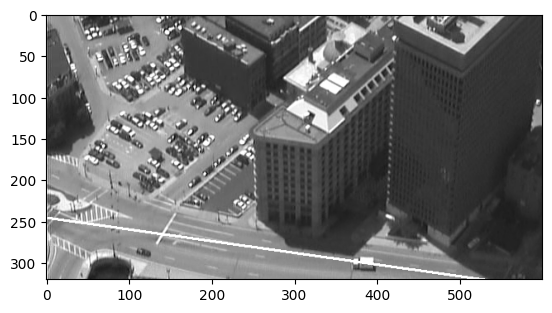

In [76]:
img_path = 'Data/frame_00000.tif'
I = Image.open(img_path).convert('RGB')
w, h = I.size
I = I.crop((0, 400, 600, h))
canv = ImageDraw.Draw(I)
line_draw(trajectory, canv, [w,h])
plot_img(I)

<Figure size 1850x1050 with 0 Axes>

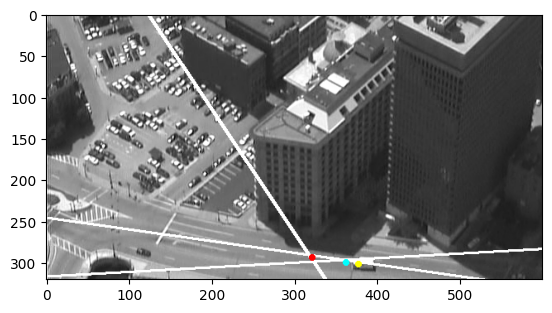

In [77]:
epiline1 = F.T @ [x2, y2, 1]
point12_proj = np.cross(trajectory, epiline1)
x12, y12 = point12_proj[:2]/point12_proj[2]

epiline2 = F_13.T @ [x3, y3, 1]
point13_proj = np.cross(trajectory, epiline2)
x13, y13 = point13_proj[:2]/point13_proj[2]

img_path = "Data/frame_00000.tif"
I = Image.open(img_path).convert('RGB')
w, h = I.size
I2 = I.crop((0, 400, 600, h))
canv2 = ImageDraw.Draw(I2)
line_draw(trajectory, canv2, size)
canv2.ellipse((x1, y1, x1+7, y1+7), fill = 'yellow', outline ='yellow')

line_draw(epiline1, canv2, size)
canv2.ellipse((x12, y12, x12+7, y12+7), fill = 'cyan', outline ='cyan')

line_draw(epiline2, canv2, size)
canv2.ellipse((x13, y13, x13+7, y13+7), fill = 'red', outline ='red')

fig = matplotlib.pyplot.gcf()
fig.set_size_inches(18.5, 10.5)
plot_img(I2)

Qualitatively, the result improved slightly, with the red point being closer to the other two.